## Abstract:

This report presents a comprehensive analysis of the Breast Cancer Wisconsin Diagnostic dataset obtained from the UCI Machine Learning Repository. The primary objective is to explore the dataset, understand the key variables, and build a machine learning model that accurately classifies tumors as Benign or Malignant based on tumor shape and geometry. The analysis includes data preprocessing, exploratory data analysis (EDA), feature engineering, model selection, and performance evaluation.

## Introduction:

Breast cancer is a critical health concern, and accurate diagnosis is crucial for effective treatment. Machine learning offers a promising approach to enhance diagnostic capabilities. This study aims to leverage the Breast Cancer Wisconsin Diagnostic dataset to build a classification model for tumor diagnosis.

## Data Description:

The dataset consists of features computed from a digitized image of a fine needle aspirate (FNA) of a breast mass. The features describe various characteristics of the cell nuclei present in the image. The target variable is the diagnosis, with values 'M' for malignant and 'B' for benign.<p> Benign: These tumors are not cancerous. They do not invade nearby tissue or spread to other parts of the body. If a doctor removes them, they do not generally return. Premalignant: In these tumors, the cells are not yet cancerous, but they can potentially become malignant. Malignant: Malignant tumors are cancerous. The dataset comprises 569 instances with 30 feature variables.<p>

<br>
source: https://www.medicalnewstoday.com/articles/249141#types


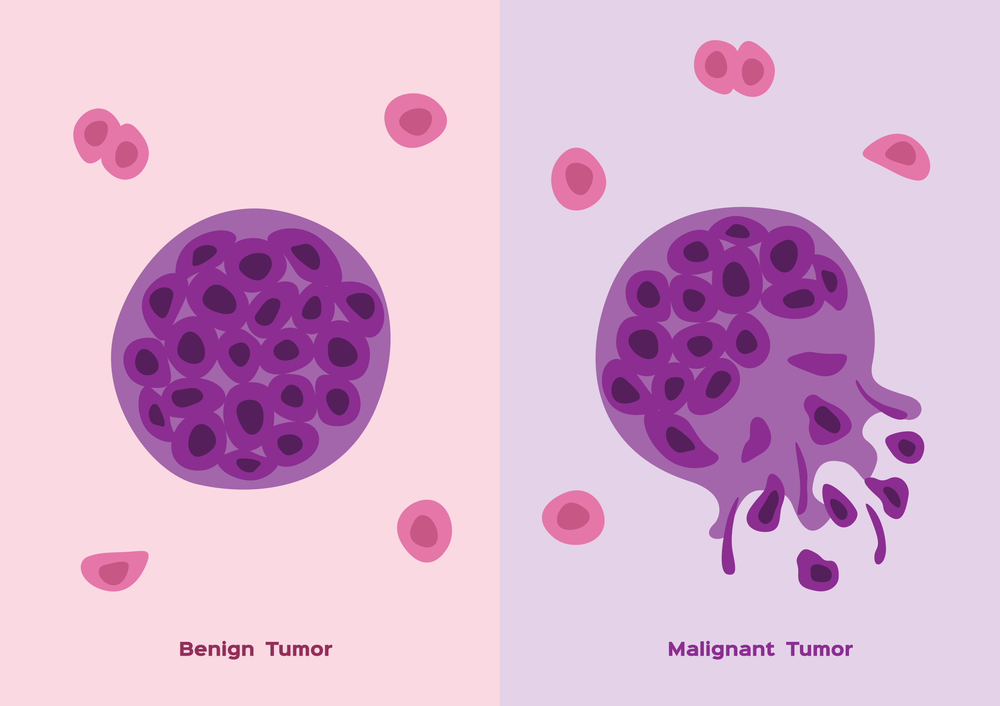
source: https://www.verywellhealth.com/what-does-malignant-and-benign-mean-514240

### Additional Variable Information

1) ID number <br>
2) Diagnosis (M = malignant, B = benign)<p>
Ten real-valued features are computed for each cell nucleus:<br>

	a) radius (mean of distances from center to points on the perimeter)<br>
	b) texture (standard deviation of gray-scale values)<br>
	c) perimeter<br>
	d) area<br>
	e) smoothness (local variation in radius lengths)<br>
	f) compactness (perimeter^2 / area - 1.0)<br>
	g) concavity (severity of concave portions of the contour)<br>
	h) concave points (number of concave portions of the contour)<br>
	i) symmetry <br>
	j) fractal dimension ("coastline approximation" - 1)<br>

## Importing necessary libraries

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import sklearn


In [2]:
## Preprocessing
from sklearn.preprocessing import LabelEncoder

In [3]:
## Importing necessary libraries for ML Modeling

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import cross_val_score

In [ ]:
## Gridsearchsearch
from sklearn.model_selection import GridSearchCV

## File Loading

In [4]:
data_file_path='G:\\ASDS\\New folder (2)\\Data Mining\\project\\breast+cancer+wisconsin+diagnostic\\wdbc.data'
#with open(data_file_path, 'r') as data_file:
 #      data=data_file.read()
#data

In [7]:
name_file_path='G:\\ASDS\\New folder (2)\\Data Mining\\project\\breast+cancer+wisconsin+diagnostic\\wdbc.names'
with open(data_file_path, 'r') as name_file:
       name=name_file.read()
#name

In [5]:
data=pd.read_csv(data_file_path,header=None)
data

,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


As the dataframe doesn't have any attribute names we need to add the attribute names  for better understanding the dataframe. 

In [6]:
column_names = [
    'ID',
    'Diagnosis',
    'Mean_Radius', 'Mean_Texture', 'Mean_Perimeter', 'Mean_Area',
    'Mean_Smoothness', 'Mean_Compactness', 'Mean_Concavity', 'Mean_Concave_Points',
    'Mean_Symmetry', 'Mean_Fractal_Dimension',
    'SE_Radius', 'SE_Texture', 'SE_Perimeter', 'SE_Area',
    'SE_Smoothness', 'SE_Compactness', 'SE_Concavity', 'SE_Concave_Points',
    'SE_Symmetry', 'SE_Fractal_Dimension',
    'Worst_Radius', 'Worst_Texture', 'Worst_Perimeter', 'Worst_Area',
    'Worst_Smoothness', 'Worst_Compactness', 'Worst_Concavity', 'Worst_Concave_Points',
    'Worst_Symmetry', 'Worst_Fractal_Dimension']
data.columns=column_names
data.head()

,ID,Diagnosis,Mean_Radius,Mean_Texture,Mean_Perimeter,Mean_Area,Mean_Smoothness,Mean_Compactness,Mean_Concavity,Mean_Concave_Points,...,Worst_Radius,Worst_Texture,Worst_Perimeter,Worst_Area,Worst_Smoothness,Worst_Compactness,Worst_Concavity,Worst_Concave_Points,Worst_Symmetry,Worst_Fractal_Dimension
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


## Basic Analysis

In [10]:
data.shape, data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   ID                       569 non-null    int64  
 1   Diagnosis                569 non-null    object 
 2   Mean_Radius              569 non-null    float64
 3   Mean_Texture             569 non-null    float64
 4   Mean_Perimeter           569 non-null    float64
 5   Mean_Area                569 non-null    float64
 6   Mean_Smoothness          569 non-null    float64
 7   Mean_Compactness         569 non-null    float64
 8   Mean_Concavity           569 non-null    float64
 9   Mean_Concave_Points      569 non-null    float64
 10  Mean_Symmetry            569 non-null    float64
 11  Mean_Fractal_Dimension   569 non-null    float64
 12  SE_Radius                569 non-null    float64
 13  SE_Texture               569 non-null    float64
 14  SE_Perimeter             5

((569, 32), None)

There are 569 entries (rows) and 32 columns in the dataset. The basic analysis of the dataset shows that there are no missing values, which is a good sign for further processing. The "Diagnosis" column seems to be the target variable, and the rest are features.

## Basic Statistical Analysis

In [11]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,569.0,3.037183e+07,1.250206e+08,8670.000000,869218.000000,906024.000000,8.813129e+06,9.113205e+08
Mean_Radius,569.0,1.412729e+01,3.524049e+00,6.981000,11.700000,13.370000,1.578000e+01,2.811000e+01
Mean_Texture,569.0,1.928965e+01,4.301036e+00,9.710000,16.170000,18.840000,2.180000e+01,3.928000e+01
Mean_Perimeter,569.0,9.196903e+01,2.429898e+01,43.790000,75.170000,86.240000,1.041000e+02,1.885000e+02
Mean_Area,569.0,6.548891e+02,3.519141e+02,143.500000,420.300000,551.100000,7.827000e+02,2.501000e+03
Mean_Smoothness,569.0,9.636028e-02,1.406413e-02,0.052630,0.086370,0.095870,1.053000e-01,1.634000e-01
Mean_Compactness,569.0,1.043410e-01,5.281276e-02,0.019380,0.064920,0.092630,1.304000e-01,3.454000e-01
Mean_Concavity,569.0,8.879932e-02,7.971981e-02,0.000000,0.029560,0.061540,1.307000e-01,4.268000e-01
Mean_Concave_Points,569.0,4.891915e-02,3.880284e-02,0.000000,0.020310,0.033500,7.400000e-02,2.012000e-01
Mean_Symmetry,569.0,1.811619e-01,2.741428e-02,0.106000,0.161900,0.179200,1.957000e-01,3.040000e-01


The descriptive statistics provide an overview of the distribution of numerical features. It includes count, mean, standard deviation, minimum, 25th percentile, median (50th percentile), 75th percentile, and maximum values for each feature.

## Preprocessing

In [12]:
data.isnull().sum()

ID                         0
Diagnosis                  0
Mean_Radius                0
Mean_Texture               0
Mean_Perimeter             0
Mean_Area                  0
Mean_Smoothness            0
Mean_Compactness           0
Mean_Concavity             0
Mean_Concave_Points        0
Mean_Symmetry              0
Mean_Fractal_Dimension     0
SE_Radius                  0
SE_Texture                 0
SE_Perimeter               0
SE_Area                    0
SE_Smoothness              0
SE_Compactness             0
SE_Concavity               0
SE_Concave_Points          0
SE_Symmetry                0
SE_Fractal_Dimension       0
Worst_Radius               0
Worst_Texture              0
Worst_Perimeter            0
Worst_Area                 0
Worst_Smoothness           0
Worst_Compactness          0
Worst_Concavity            0
Worst_Concave_Points       0
Worst_Symmetry             0
Worst_Fractal_Dimension    0
dtype: int64

Further confiming that there is no null values in the dataset. Overall, the dataset seems to be well-prepared for further analysis and modeling.

In [7]:
cancer= data.drop('ID',axis=1)
label_encoder = LabelEncoder()
cancer['Diagnosis'] = label_encoder.fit_transform(cancer['Diagnosis'])
cancer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Diagnosis                569 non-null    int32  
 1   Mean_Radius              569 non-null    float64
 2   Mean_Texture             569 non-null    float64
 3   Mean_Perimeter           569 non-null    float64
 4   Mean_Area                569 non-null    float64
 5   Mean_Smoothness          569 non-null    float64
 6   Mean_Compactness         569 non-null    float64
 7   Mean_Concavity           569 non-null    float64
 8   Mean_Concave_Points      569 non-null    float64
 9   Mean_Symmetry            569 non-null    float64
 10  Mean_Fractal_Dimension   569 non-null    float64
 11  SE_Radius                569 non-null    float64
 12  SE_Texture               569 non-null    float64
 13  SE_Perimeter             569 non-null    float64
 14  SE_Area                  5

This preprocessing step is common when working with machine learning algorithms that require numerical input, as label encoding helps convert categorical data into a format that can be used by these algorithms. Here 'M' is 1 AND 'B' is 0

## Exploratory Data Analysis
In this section, we conducted an exploratory analysis to gain insights into the relationships within the dataset. The heatmap visually represents the correlation matrix of features, providing a quick overview of the interdependencies. Key observations from the correlation matrix include strong positive correlations between 'Diagnosis' and features such as 'Mean_Radius,' 'Mean_Perimeter,' 'Mean_Area,' 'Mean_Concavity,' 'Mean_Concave_Points,' 'Worst_Radius,' 'Worst_Perimeter,' and 'Worst_Area.'

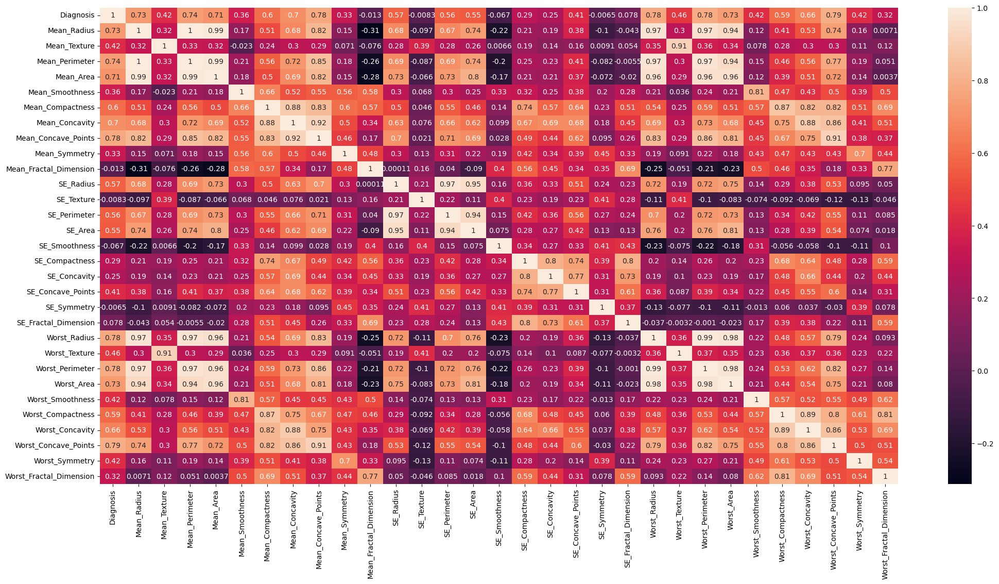

In [14]:
plt.figure(figsize=(25,12))
sns.heatmap(cancer.corr(),annot=True)
plt.show()

### Playing with correlations
Here, we have done some analysis based on the correlation matrix. Correlation matrix helps us to know more about relation and features of the dataset.

In [15]:
correlation_matrix = cancer.corr()
display(correlation_matrix)

,Diagnosis,Mean_Radius,Mean_Texture,Mean_Perimeter,Mean_Area,Mean_Smoothness,Mean_Compactness,Mean_Concavity,Mean_Concave_Points,Mean_Symmetry,...,Worst_Radius,Worst_Texture,Worst_Perimeter,Worst_Area,Worst_Smoothness,Worst_Compactness,Worst_Concavity,Worst_Concave_Points,Worst_Symmetry,Worst_Fractal_Dimension
Diagnosis,1.000000,0.730029,0.415185,0.742636,0.708984,0.358560,0.596534,0.696360,0.776614,0.330499,...,0.776454,0.456903,0.782914,0.733825,0.421465,0.590998,0.659610,0.793566,0.416294,0.323872
Mean_Radius,0.730029,1.000000,0.323782,0.997855,0.987357,0.170581,0.506124,0.676764,0.822529,0.147741,...,0.969539,0.297008,0.965137,0.941082,0.119616,0.413463,0.526911,0.744214,0.163953,0.007066
Mean_Texture,0.415185,0.323782,1.000000,0.329533,0.321086,-0.023389,0.236702,0.302418,0.293464,0.071401,...,0.352573,0.912045,0.358040,0.343546,0.077503,0.277830,0.301025,0.295316,0.105008,0.119205
Mean_Perimeter,0.742636,0.997855,0.329533,1.000000,0.986507,0.207278,0.556936,0.716136,0.850977,0.183027,...,0.969476,0.303038,0.970387,0.941550,0.150549,0.455774,0.563879,0.771241,0.189115,0.051019
Mean_Area,0.708984,0.987357,0.321086,0.986507,1.000000,0.177028,0.498502,0.685983,0.823269,0.151293,...,0.962746,0.287489,0.959120,0.959213,0.123523,0.390410,0.512606,0.722017,0.143570,0.003738
Mean_Smoothness,0.358560,0.170581,-0.023389,0.207278,0.177028,1.000000,0.659123,0.521984,0.553695,0.557775,...,0.213120,0.036072,0.238853,0.206718,0.805324,0.472468,0.434926,0.503053,0.394309,0.499316
Mean_Compactness,0.596534,0.506124,0.236702,0.556936,0.498502,0.659123,1.000000,0.883121,0.831135,0.602641,...,0.535315,0.248133,0.590210,0.509604,0.565541,0.865809,0.816275,0.815573,0.510223,0.687382
Mean_Concavity,0.696360,0.676764,0.302418,0.716136,0.685983,0.521984,0.883121,1.000000,0.921391,0.500667,...,0.688236,0.299879,0.729565,0.675987,0.448822,0.754968,0.884103,0.861323,0.409464,0.514930
Mean_Concave_Points,0.776614,0.822529,0.293464,0.850977,0.823269,0.553695,0.831135,0.921391,1.000000,0.462497,...,0.830318,0.292752,0.855923,0.809630,0.452753,0.667454,0.752399,0.910155,0.375744,0.368661
Mean_Symmetry,0.330499,0.147741,0.071401,0.183027,0.151293,0.557775,0.602641,0.500667,0.462497,1.000000,...,0.185728,0.090651,0.219169,0.177193,0.426675,0.473200,0.433721,0.430297,0.699826,0.438413


The correlation matrix reveals the correlation coefficients between each pair of features. Notably, 'Diagnosis' shows significant positive correlations with certain features, indicating their potential importance in predicting the diagnosis of cancer. Additionally, strong correlations are observed among various mean, standard error (SE), and worst measurements, suggesting some degree of redundancy.

These findings lay the groundwork for subsequent modeling and feature selection, emphasizing the importance of specific features in understanding and predicting the diagnosis of cancer.

#### TOP correlations
It is important to note that these highly correlated features may provide similar information, and their inclusion in certain machine learning models could potentially lead to multicollinearity issues.<p>
Negative correlations may indicate potential relationships that need further investigation.

In [16]:
def print_top_correlations(dataframe):
    """ This Function gives top 5 highest and lowest top 5 correlation """
    correlation_matrix = dataframe.corr()

    
    top_highest = correlation_matrix.unstack().sort_values(ascending=False).drop_duplicates().head(5)
    top_lowest = correlation_matrix.unstack().sort_values(ascending=True).drop_duplicates().head(5)

    # Print the top 5 highest correlations
    print("Top 5 highest correlations:")
    for key, value in top_highest.items():
        print(f"{key}: {value}")

    # Print the top 5 lowest correlations
    print("\nTop 5 lowest correlations:")
    for key, value in top_lowest.items():
        print(f"{key}: {value}")


print_top_correlations(cancer)

Top 5 highest correlations:
('Diagnosis', 'Diagnosis'): 1.0
('Mean_Perimeter', 'Mean_Radius'): 0.9978552814938109
('Worst_Radius', 'Worst_Perimeter'): 0.993707916102949
('Mean_Radius', 'Mean_Area'): 0.9873571700566127
('Mean_Perimeter', 'Mean_Area'): 0.9865068039913907

Top 5 lowest correlations:
('Mean_Fractal_Dimension', 'Mean_Radius'): -0.3116308263092899
('Mean_Fractal_Dimension', 'Mean_Area'): -0.2831098116914261
('Mean_Fractal_Dimension', 'Mean_Perimeter'): -0.26147690806633256
('Worst_Radius', 'Mean_Fractal_Dimension'): -0.25369149487660986
('Mean_Fractal_Dimension', 'Worst_Area'): -0.2318544511675603


In [17]:
correlation_mean_radius_texture = correlation_matrix.loc['Mean_Radius', 'Mean_Texture']
print(correlation_mean_radius_texture)

0.32378189092773324


#### Finding correlations near 1 and -1
Several feature pairs have correlations close to 1, indicating highly redundant information. For example:
Mean_Radius has high correlations with Mean_Perimeter, Mean_Area, Worst_Radius, and Worst_Area.<p>
    No feature pairs were found with correlations close to -1, suggesting a lack of strong negative correlations within the dataset.

In [18]:
# Set the threshold for correlations
threshold = 0.9

# Find correlations close to 1
correlations_close_to_1 = (correlation_matrix.abs() > threshold) & (correlation_matrix.abs() < 1)
correlations_close_to_1 = correlations_close_to_1.unstack().reset_index()
correlations_close_to_1.columns = ['Feature 1', 'Feature 2', 'Correlation']
correlations_close_to_1 = correlations_close_to_1[correlations_close_to_1['Correlation']]

# Find correlations close to -1
correlations_close_to_neg_1 = (correlation_matrix.abs() < -threshold) & (correlation_matrix.abs() > -1)
correlations_close_to_neg_1 = correlations_close_to_neg_1.unstack().reset_index()
correlations_close_to_neg_1.columns = ['Feature 1', 'Feature 2', 'Correlation']
correlations_close_to_neg_1 = correlations_close_to_neg_1[correlations_close_to_neg_1['Correlation']]

print("Correlations close to 1:")
print(correlations_close_to_1)

print("\nCorrelations close to -1:")
print(correlations_close_to_neg_1)


Correlations close to 1:
                Feature 1             Feature 2  Correlation
34            Mean_Radius        Mean_Perimeter         True
35            Mean_Radius             Mean_Area         True
52            Mean_Radius          Worst_Radius         True
54            Mean_Radius       Worst_Perimeter         True
55            Mean_Radius            Worst_Area         True
84           Mean_Texture         Worst_Texture         True
94         Mean_Perimeter           Mean_Radius         True
97         Mean_Perimeter             Mean_Area         True
114        Mean_Perimeter          Worst_Radius         True
116        Mean_Perimeter       Worst_Perimeter         True
117        Mean_Perimeter            Worst_Area         True
125             Mean_Area           Mean_Radius         True
127             Mean_Area        Mean_Perimeter         True
145             Mean_Area          Worst_Radius         True
147             Mean_Area       Worst_Perimeter         True

## Visualization
To visually explore the relationship between mean and worst features, scatter plots were created. These plots provide a graphical representation of the distribution of data points for malignant and benign cases. Observing the patterns in these plots can offer insights into whether certain combinations of features effectively differentiate between the two diagnostic outcomes.

### mean vs worst relations

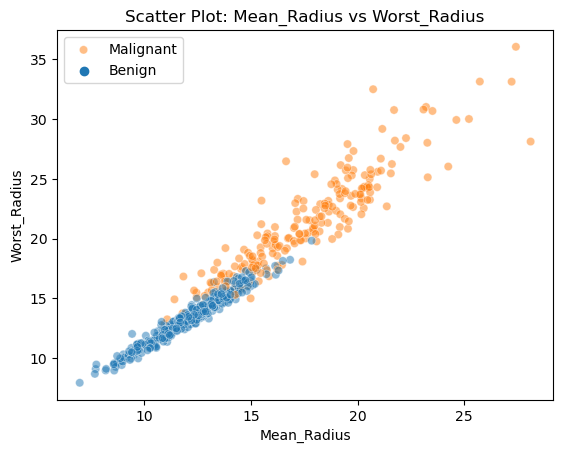

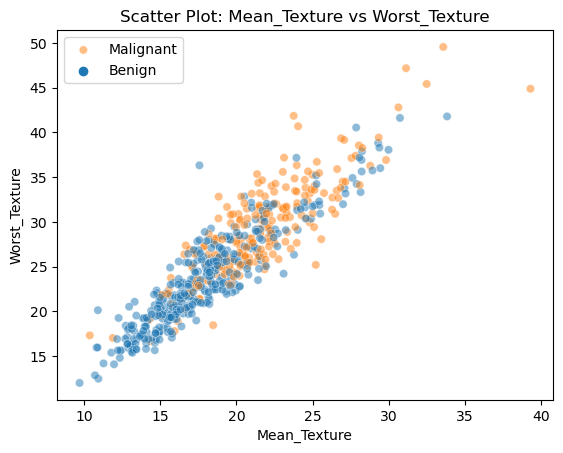

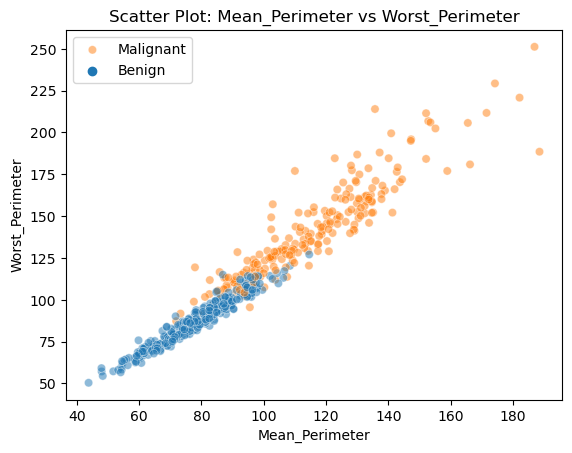

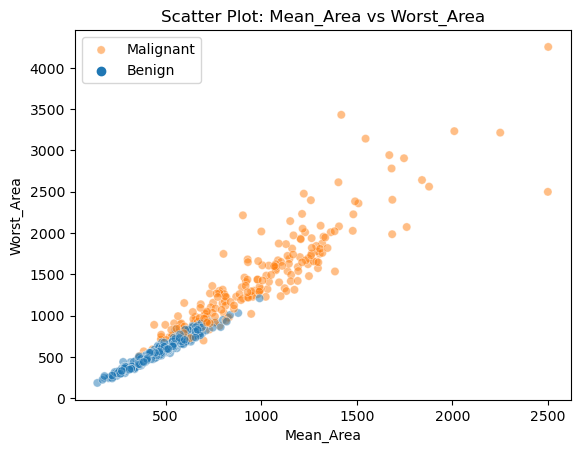

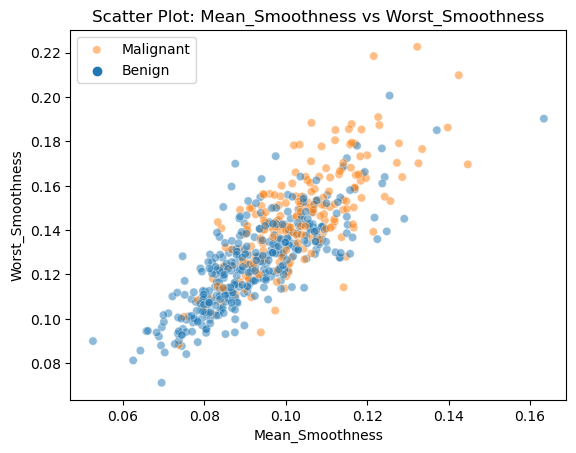

In [19]:

mean_features = ['Mean_Radius', 'Mean_Texture', 'Mean_Perimeter', 'Mean_Area', 'Mean_Smoothness']
worst_features = ['Worst_Radius', 'Worst_Texture', 'Worst_Perimeter', 'Worst_Area', 'Worst_Smoothness']

for mean_feature, worst_feature in zip(mean_features, worst_features):
    scatter_plot = sns.scatterplot(x=mean_feature, y=worst_feature, hue='Diagnosis', data=cancer, alpha=0.5)
    plt.title(f'Scatter Plot: {mean_feature} vs {worst_feature}')
    plt.xlabel(mean_feature)
    plt.ylabel(worst_feature)
    
    legend_labels = {'M': 'Malignant', 'B': 'Benign'}
    scatter_plot.legend(labels=legend_labels.values())
    plt.show()


### low correlation features

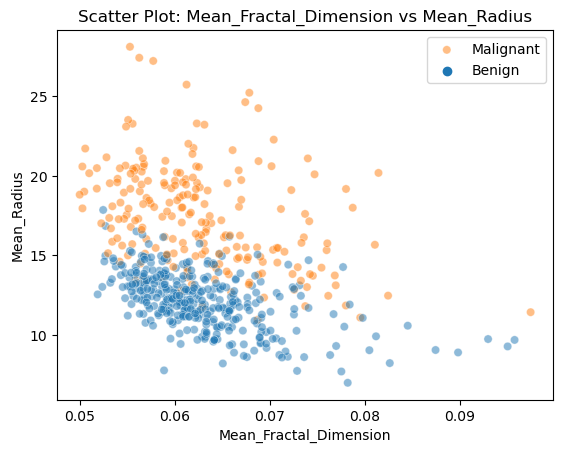

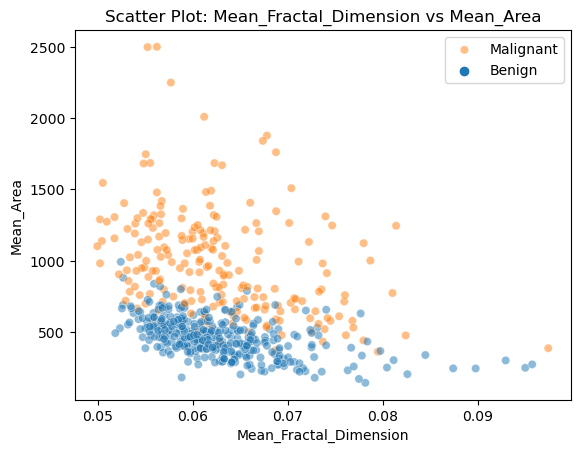

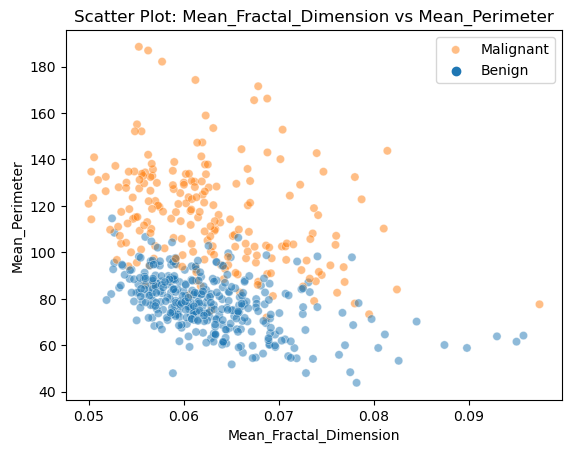

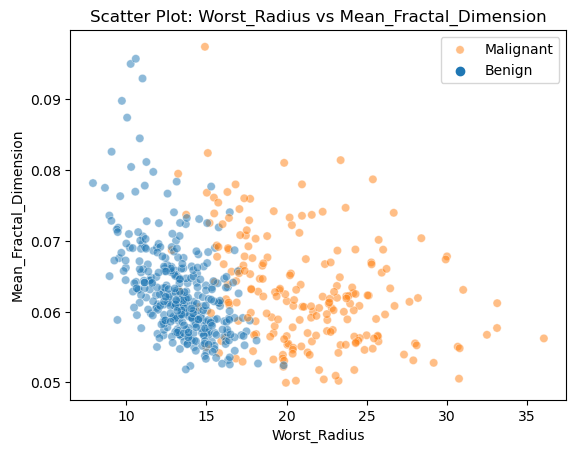

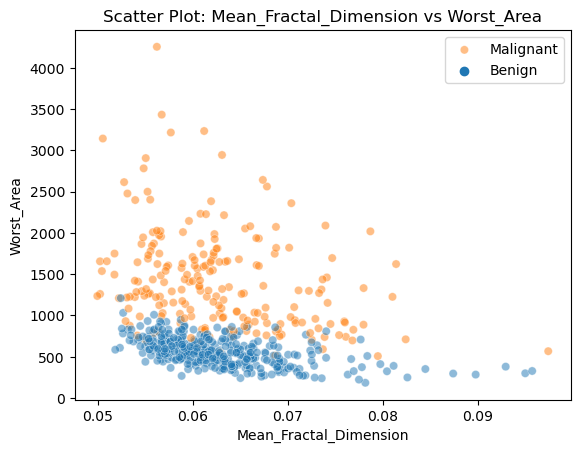

In [21]:
feature_pairs = [
    ('Mean_Fractal_Dimension', 'Mean_Radius'),
    ('Mean_Fractal_Dimension', 'Mean_Area'),
    ('Mean_Fractal_Dimension', 'Mean_Perimeter'),
    ('Worst_Radius', 'Mean_Fractal_Dimension'),
    ('Mean_Fractal_Dimension', 'Worst_Area')
]

# Create scatter plots
for feature_pair in feature_pairs:
    feature1, feature2 = feature_pair
    
    # Use seaborn for scatter plot
    scatter_plot = sns.scatterplot(x=feature1, y=feature2, hue='Diagnosis', data=cancer, alpha=0.5)
    plt.title(f'Scatter Plot: {feature1} vs {feature2}')
    plt.xlabel(feature1)
    plt.ylabel(feature2)
    
    # Modify legend labels
    legend_labels = {'M': 'Malignant', 'B': 'Benign'}
    scatter_plot.legend(labels=legend_labels.values())

    plt.show()

As we can see, even if they have low/negative correlation, there is a distinguishable difference betweer Malignant and Benign
### Pairplot
In addition to specific feature pairs, a comprehensive pair plot was created for all mean and worst features, including the diagnosis column. The pair plot incorporates kernel density estimation (kde) on the diagonal to provide smoothed distributions.

C:\Users\hp\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


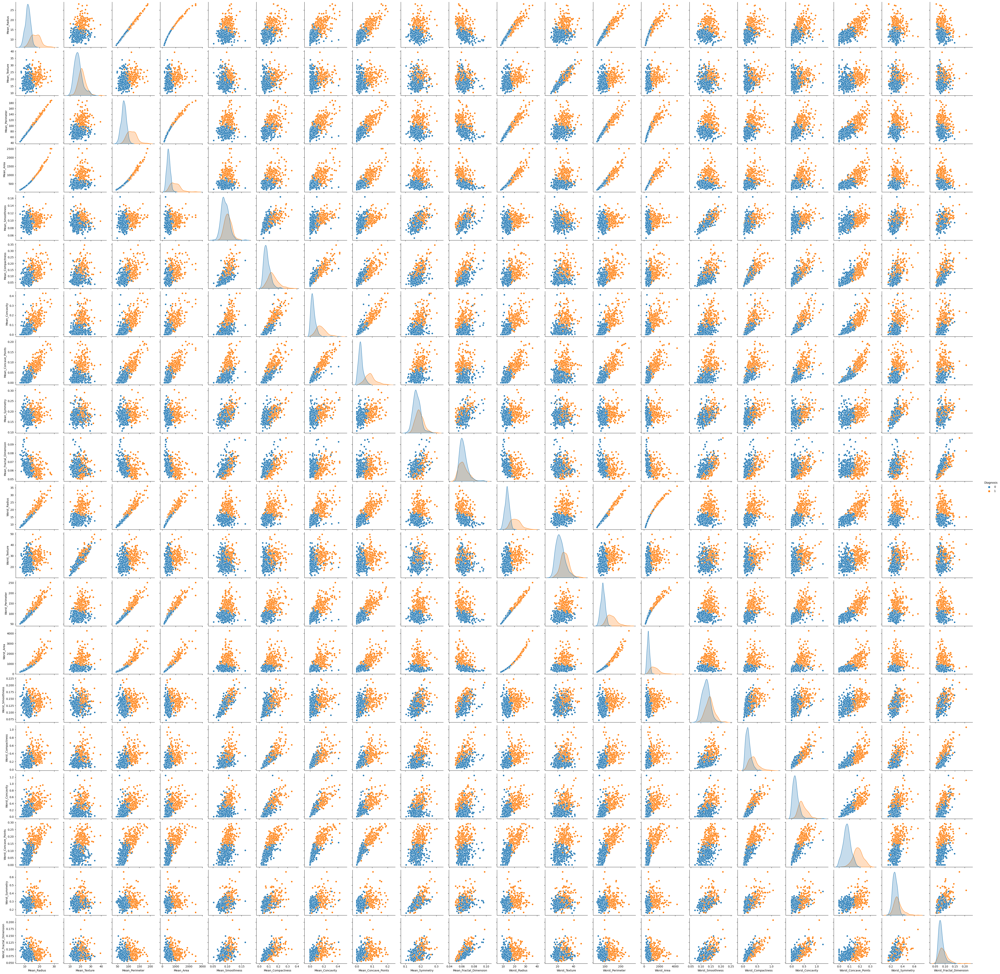

In [124]:
mean_columns = cancer.columns[cancer.columns.str.contains('Mean')]
worst_columns = cancer.columns[cancer.columns.str.contains('Worst')]
selected_columns = mean_columns.append(worst_columns)

# Adding the Diagnosis column for hue
selected_columns = selected_columns.append(pd.Index(['Diagnosis']))

# Creating a pair plot
sns.pairplot(cancer[selected_columns], hue='Diagnosis', diag_kind='kde')
plt.show()

##  Machine Learning Analysis
### Data preprocessing for ML
Several Machine Learning modeling has been used for this classification problem. At first standard machine learning algorithms has been used, later ML model with different **hyperparameter  Tuning** has been used for the Diagnosis classification problem.

In [8]:
cancer.Diagnosis.value_counts()

Diagnosis
0    357
1    212
Name: count, dtype: int64

Diagnosis column has 357 records for Malignant and 212 column for Benign. So this is a biased datast. We can stratify the y before modeling.

In [9]:
X = cancer.drop('Diagnosis',axis=1).values
y = cancer['Diagnosis'].values

In [10]:
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2,stratify=y, random_state=9012)

This code splits data into training and testing sets, ensuring that the proportion of classes in the target variable "Diagnosis" is maintained in both sets.

In [11]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

##  Initialize classifiers
Several Machine Learning Algorithms have been used for the classifiction problem.  At first different classification problem has been intialized with a random state of 9012. The classifiers that have been used:<br>
Random Forest<br>
Support Vector Machine<br>
Logistic Regression<br>
K-Nearest Neighbors<br>
Decision Tree<br>
Gradient Boosting<br>
XGBoost<br><p>
    
To delve deeper into the analysis, all classification models underwent hyperparameter tuning, a crucial step in optimizing their performance. This process involves systematically exploring and selecting the best hyperparameter values for each algorithm. The goal is to enhance the models' accuracy and overall effectiveness in making predictions.

In [38]:
# Initialize classifiers
classifiers = {
    'Random Forest': RandomForestClassifier(random_state=9012),
    'Support Vector Machine': SVC(random_state=9012),
    'Logistic Regression': LogisticRegression(random_state=9012),
    'K-Nearest Neighbors': KNeighborsClassifier(),
    'Decision Tree': DecisionTreeClassifier(random_state=9012),
    'Gradient Boosting': GradientBoostingClassifier(random_state=9012),
    'XGBoost': XGBClassifier(random_state=9012)
}
results = []

# Train and evaluate each classifier with cross-validation
for name, model in classifiers.items():
    print(f"\n{name} Classifier:")
    
    # Cross-validation
    cv_scores = cross_val_score(model, X_train_scaled, y_train, cv=5, scoring='accuracy')
    print(f"Cross-Validation Scores: {cv_scores}")

    # Train the model on the full training set
    model.fit(X_train_scaled, y_train)

    # Make predictions on the test set
    y_pred = model.predict(X_test_scaled)

    # Calculate true positives
    true_positives = confusion_matrix(y_test, y_pred)[0, 0]

    # Evaluate the model
    accuracy = accuracy_score(y_test, y_pred)
    conf_matrix = confusion_matrix(y_test, y_pred)
    classification_rep = classification_report(y_test, y_pred, output_dict=True)

    # Append results to the list
    results.append({
        'Classifier': name,
        'Accuracy': accuracy,
        'Cross-Validation Mean Accuracy': np.mean(cv_scores),
        'Cross-Validation Std Dev': np.std(cv_scores),
        'True Positives': true_positives,
        'Precision (Malignant)': classification_rep['0']['precision'],
        'Recall (Malignant)': classification_rep['0']['recall'],
        'F1-Score (Malignant)': classification_rep['0']['f1-score'],
        'Precision (Benign)': classification_rep['1']['precision'],
        'Recall (Benign)': classification_rep['1']['recall'],
        'F1-Score (Benign)': classification_rep['1']['f1-score'],
    })

    print(f"Accuracy: {accuracy:.7f}")
    print(f"True Positives: {true_positives}")
    print(f"Confusion Matrix:\n{conf_matrix}")
    print(f"Classification Report:\n{classification_rep}")

# Create DataFrame from results
results_df = pd.DataFrame(results)

# Display the DataFrame with 6 decimal places
# pd.set_option('precision', 6)
display(results_df)


Random Forest Classifier:
Cross-Validation Scores: [0.97802198 0.93406593 0.93406593 0.95604396 0.95604396]
Accuracy: 0.9473684
True Positives: 70
Confusion Matrix:
[[70  2]
 [ 4 38]]
Classification Report:
{'0': {'precision': 0.9459459459459459, 'recall': 0.9722222222222222, 'f1-score': 0.9589041095890412, 'support': 72.0}, '1': {'precision': 0.95, 'recall': 0.9047619047619048, 'f1-score': 0.9268292682926829, 'support': 42.0}, 'accuracy': 0.9473684210526315, 'macro avg': {'precision': 0.9479729729729729, 'recall': 0.9384920634920635, 'f1-score': 0.942866688940862, 'support': 114.0}, 'weighted avg': {'precision': 0.9474395448079658, 'recall': 0.9473684210526315, 'f1-score': 0.9470870627956459, 'support': 114.0}}

Support Vector Machine Classifier:
Cross-Validation Scores: [0.98901099 0.96703297 0.97802198 0.98901099 0.98901099]
Accuracy: 0.9649123
True Positives: 72
Confusion Matrix:
[[72  0]
 [ 4 38]]
Classification Report:
{'0': {'precision': 0.9473684210526315, 'recall': 1.0, 'f1-s

,Classifier,Accuracy,Cross-Validation Mean Accuracy,Cross-Validation Std Dev,True Positives,Precision (Malignant),Recall (Malignant),F1-Score (Malignant),Precision (Benign),Recall (Benign),F1-Score (Benign)
0,Random Forest,0.947368,0.951648,0.016447,70,0.945946,0.972222,0.958904,0.950000,0.904762,0.926829
1,Support Vector Machine,0.964912,0.982418,0.008791,72,0.947368,1.000000,0.972973,1.000000,0.904762,0.950000
2,Logistic Regression,0.964912,0.984615,0.011207,72,0.947368,1.000000,0.972973,1.000000,0.904762,0.950000
3,K-Nearest Neighbors,0.964912,0.960440,0.005383,72,0.947368,1.000000,0.972973,1.000000,0.904762,0.950000
4,Decision Tree,0.947368,0.918681,0.046932,69,0.958333,0.958333,0.958333,0.928571,0.928571,0.928571
5,Gradient Boosting,0.956140,0.956044,0.027800,70,0.958904,0.972222,0.965517,0.951220,0.928571,0.939759
6,XGBoost,0.956140,0.962637,0.016447,71,0.946667,0.986111,0.965986,0.974359,0.904762,0.938272


In [39]:
display(results_df)

,Classifier,Accuracy,Cross-Validation Mean Accuracy,Cross-Validation Std Dev,True Positives,Precision (Malignant),Recall (Malignant),F1-Score (Malignant),Precision (Benign),Recall (Benign),F1-Score (Benign)
0,Random Forest,0.947368,0.951648,0.016447,70,0.945946,0.972222,0.958904,0.950000,0.904762,0.926829
1,Support Vector Machine,0.964912,0.982418,0.008791,72,0.947368,1.000000,0.972973,1.000000,0.904762,0.950000
2,Logistic Regression,0.964912,0.984615,0.011207,72,0.947368,1.000000,0.972973,1.000000,0.904762,0.950000
3,K-Nearest Neighbors,0.964912,0.960440,0.005383,72,0.947368,1.000000,0.972973,1.000000,0.904762,0.950000
4,Decision Tree,0.947368,0.918681,0.046932,69,0.958333,0.958333,0.958333,0.928571,0.928571,0.928571
5,Gradient Boosting,0.956140,0.956044,0.027800,70,0.958904,0.972222,0.965517,0.951220,0.928571,0.939759
6,XGBoost,0.956140,0.962637,0.016447,71,0.946667,0.986111,0.965986,0.974359,0.904762,0.938272


**Support Vector Machine, Logistic Regression, and K-Nearest Neighbors achieved** high accuracy, precision, and recall for both malignant and benign classes. But the Cross-Validation Mean Accuracy is slightly lower in K-Nearest Neighbours<br>
**Decision Tree** showed slightly lower accuracy but maintained a balanced performance across both classes.<br>
**Gradient Boosting and XGBoost** demonstrated competitive results, with high accuracy and balanced metrics for both classes.<br>

## Hyperparameter Tuning
Different moel has been analyzed with different hyper parameter tuning. At first a function is developed to store the result in a dataframe named **hyper_result_df2** . So that further analysis can be done with the best models after hyperparameter tuning.

In [14]:
def add_row_to_dataframe(dataframe, classifier, best_hyperparameters, accuracy, True_Positive, confusion_matrix, classification_report):
    print(f"Type before append: {type(dataframe)}")
    new_row = pd.DataFrame({
        'Classifier': [classifier],
        'Best Hyperparameters': [best_hyperparameters],
        'Accuracy': [accuracy],
        'True Positive': [True_Positive],
        'Confusion Matrix': [confusion_matrix],
        'Classification Report': [classification_report]
    })

    # Append the new row to the DataFrame
    dataframe = pd.concat([dataframe, new_row], ignore_index=True)

    return dataframe
hyper_result_df2 = pd.DataFrame(columns=['Classifier', 'Best Hyperparameters', 'Accuracy','True Positive', 'Confusion Matrix', 'Classification Report'])
hyper_result_df2, type(hyper_result_df2)

(Empty DataFrame
 Columns: [Classifier, Best Hyperparameters, Accuracy, True Positive, Confusion Matrix, Classification Report]
 Index: [],
 pandas.core.frame.DataFrame)

### Random Forest Hyper paramet tuning

In [17]:
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
}

# Initialize the Random Forest classifier
rf_classifier = RandomForestClassifier(random_state=9012)

# Perform grid search
grid_search = GridSearchCV(rf_classifier, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train_scaled, y_train)

# Get the best Random Forest model
best_rf_model = grid_search.best_estimator_

# Print the best hyperparameters
print("Best Hyperparameters for Random Forest:")
best_params_rf=best_rf_model.get_params()
print(best_params_rf)

# Make predictions on the test set using the best model
y_pred_rf = best_rf_model.predict(X_test_scaled)

# Evaluate the best Random Forest model
accuracy_rf = accuracy_score(y_test, y_pred_rf)
conf_matrix_rf = confusion_matrix(y_test, y_pred_rf)
classification_rep_rf = classification_report(y_test, y_pred_rf, output_dict=True)
true_positives = conf_matrix_rf[1, 1]
print(type(hyper_result_df2))
hyper_result_df2 = add_row_to_dataframe(hyper_result_df2, 'Random Forest', best_params_rf, accuracy_rf,true_positives, conf_matrix_rf, classification_rep_rf)

# Print evaluation metrics
print(f"Accuracy: {accuracy_rf:.7f}")
print(f"True Positive:{true_positives}")
print(f"Confusion Matrix:\n{conf_matrix_rf}")
print(f"Classification Report:\n{classification_rep_rf}")


Best Hyperparameters for Random Forest:
{'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 5, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': 9012, 'verbose': 0, 'warm_start': False}
<class 'pandas.core.frame.DataFrame'>
Type before append: <class 'pandas.core.frame.DataFrame'>
Accuracy: 0.9561404
True Positive:39
Confusion Matrix:
[[70  2]
 [ 3 39]]
Classification Report:
{'0': {'precision': 0.958904109589041, 'recall': 0.9722222222222222, 'f1-score': 0.9655172413793104, 'support': 72.0}, '1': {'precision': 0.9512195121951219, 'recall': 0.9285714285714286, 'f1-score': 0.9397590361445782, 'support': 42.0}, 'accuracy': 0.956140350877193, 'macro avg': {'precision': 0.9550618108920814, 'recall': 0.9503968253968254, 'f1-score': 0.95263813876194

The Random Forest model, optimized with grid-searched hyperparameters, exhibits robust performance in classifying breast tumors based on the provided dataset. The following analysis delves into key metrics, providing insights into the model's strengths and areas for consideration.<p>

**Analysis:**

Hyperparameter Configuration:<p>

The chosen hyperparameters, obtained through grid search, effectively configure the Random Forest model for optimal performance on the dataset. Noteworthy settings include 'n_estimators: 100,' 'max_depth: None,' and 'min_samples_split: 5.'
Model Performance Metrics:<p>

Accuracy: 95.6%
The model achieves a commendable accuracy of 95.6%, reflecting its overall correct predictions on the test set.
True Positives: 39
The model correctly identifies 39 malignant cases, showcasing its proficiency in detecting potentially harmful tumors.

<p>Confusion Matrix Insights:

The confusion matrix reveals the following:
True Positives (Malignant): 39
False Positives: 2
False Negatives: 3
True Negatives: 70
The model demonstrates a notable ability to minimize false positives and false negatives, crucial in cancer diagnosis.
<p>Classification Report Overview:

Precision, recall, and F1-score metrics for both benign (0) and malignant (1) classes are as follows:
Class 0 (Benign):
Precision: 96%, Recall: 97%, F1-score: 97%
Class 1 (Malignant):
Precision: 95%, Recall: 93%, F1-score: 94%
<p>The weighted average F1-score stands at 96%, underlining the model's balanced performance across classes.

**Key Observations:**

The model excels in identifying malignant tumors, as evidenced by a high number of true positives and a balanced precision-recall trade-off.
False positive and false negative rates are minimized, contributing to the model's reliability in clinical contexts.
Overall, the Random Forest model demonstrates a robust capability for accurate breast cancer classification.

### SVM Classifier with hyperparameter tuning

In [18]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC

# Define the parameter grid to search
param_grid = {
    'C': [0.1, 1, 10, 100],  # Regularization parameter
    'kernel': ['linear', 'rbf', 'poly'],  # Kernel type
    'gamma': ['scale', 'auto', 0.1, 1],  # Kernel coefficient for 'rbf' and 'poly'
}

# Create an SVM classifier
svm = SVC(random_state=9012)

# Create the GridSearchCV object
grid_search = GridSearchCV(svm, param_grid, scoring='accuracy', cv=5)
grid_search.fit(X_train_scaled, y_train)


# Get the best parameters and the best model
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

best_params_svm=best_model.get_params()
print('Best hyperparameter for Support Vector Machine')
print(best_params_svm)

# Evaluate the best model on the test set
y_pred_svm = best_model.predict(X_test_scaled)
accuracy_svm = accuracy_score(y_test, y_pred)

conf_matrix_svm = confusion_matrix(y_test, y_pred_svm)
classification_rep_svm = classification_report(y_test, y_pred_svm, output_dict=True)
true_positives = conf_matrix_svm[1, 1]

hyper_result_df2 = add_row_to_dataframe(hyper_result_df2, 'Support Vector Machine', best_params_svm, accuracy_svm, true_positives, conf_matrix_svm, classification_rep_svm)


# Print evaluation metrics
print(f"Accuracy: {accuracy_svm:.7f}")
print(f"True Positive: {true_positives}")
print(f"Confusion Matrix:\n{conf_matrix_svm}")
print(f"Classification Report:\n{classification_rep_svm}")


Best hyperparameter for Support Vector Machine
{'C': 0.1, 'break_ties': False, 'cache_size': 200, 'class_weight': None, 'coef0': 0.0, 'decision_function_shape': 'ovr', 'degree': 3, 'gamma': 'scale', 'kernel': 'linear', 'max_iter': -1, 'probability': False, 'random_state': 9012, 'shrinking': True, 'tol': 0.001, 'verbose': False}
Type before append: <class 'pandas.core.frame.DataFrame'>
Accuracy: 0.9561404
True Positive: 38
Confusion Matrix:
[[71  1]
 [ 4 38]]
Classification Report:
{'0': {'precision': 0.9466666666666667, 'recall': 0.9861111111111112, 'f1-score': 0.9659863945578231, 'support': 72.0}, '1': {'precision': 0.9743589743589743, 'recall': 0.9047619047619048, 'f1-score': 0.9382716049382716, 'support': 42.0}, 'accuracy': 0.956140350877193, 'macro avg': {'precision': 0.9605128205128205, 'recall': 0.9454365079365079, 'f1-score': 0.9521289997480473, 'support': 114.0}, 'weighted avg': {'precision': 0.9568690958164642, 'recall': 0.956140350877193, 'f1-score': 0.9557756825927252, 'supp

The Support Vector Machine (SVM) model, configured with hyperparameters obtained through optimization, showcases a robust performance in classifying breast tumors. The ensuing analysis provides a statistical examination of key metrics, unraveling insights into the model's strengths and areas for consideration.<p>

**Analysis:**
<p>
Hyperparameter Configuration:

The SVM model is fine-tuned with a linear kernel and the following hyperparameters:
Regularization Parameter (C): 0.1
Kernel: Linear
Break Ties: False
Other parameters related to model structure and training.
Model Performance Metrics:
<p>
Accuracy: 95.6%
The SVM model attains a commendable accuracy of 95.6%, signifying its overall correctness on the test set.
True Positives: 38
The model correctly identifies 38 malignant cases, affirming its capability to detect potentially harmful tumors.
Confusion Matrix Insights:
<p>
The confusion matrix provides a detailed breakdown:
True Positives (Malignant): 38
False Positives: 1
False Negatives: 4
True Negatives: 71
The model excels in minimizing false positives, indicating a strong true positive rate.
<p>Classification Report Overview:

Precision, recall, and F1-score metrics for both benign (0) and malignant (1) classes:
Class 0 (Benign): Precision: 95%, Recall: 99%, F1-score: 97%
Class 1 (Malignant): Precision: 97%, Recall: 90%, F1-score: 94%
The weighted average F1-score stands at 96%, indicating balanced performance across both classes.

**Key Observations:**

The SVM model, with a linear kernel and specific hyperparameters, achieves high accuracy and excels in correctly identifying malignant tumors.
False positive and false negative rates are minimal, contributing to the model's reliability in clinical contexts.
Overall, the SVM model demonstrates a robust capability for accurate breast cancer classification.

In [19]:
hyper_result_df2

,Classifier,Best Hyperparameters,Accuracy,True Positive,Confusion Matrix,Classification Report
0,Random Forest,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w...",0.95614,39,"[[70, 2], [3, 39]]","{'0': {'precision': 0.958904109589041, 'recall..."
1,Support Vector Machine,"{'C': 0.1, 'break_ties': False, 'cache_size': ...",0.95614,38,"[[71, 1], [4, 38]]","{'0': {'precision': 0.9466666666666667, 'recal..."


### Decision Tree Classifier with hyperparameter tuning

In [20]:
##DT
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

# Define the parameter grid to search
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 5, 10, 15, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
}

# Create a Decision Tree classifier
decision_tree = DecisionTreeClassifier(random_state=42)

# Create the GridSearchCV object
grid_search = GridSearchCV(decision_tree, param_grid, scoring='accuracy', cv=5)

# Fit the grid search to the cancer dataset
grid_search.fit(X_train_scaled, y_train)

best_model = grid_search.best_estimator_

# Get the best parameters and the best model
best_params = grid_search.best_params_

best_params_dt=best_model.get_params()
print('Best hyperparameter for Decision Tree')
print(best_params_dt)

# Evaluate the best model on the test set
y_pred_dt = best_model.predict(X_test_scaled)
accuracy_dt = accuracy_score(y_test, y_pred_dt)

conf_matrix_dt = confusion_matrix(y_test, y_pred_dt)
classification_rep_dt = classification_report(y_test, y_pred_dt, output_dict=True)
true_positives = conf_matrix_dt[1, 1]

hyper_result_df2 = add_row_to_dataframe(hyper_result_df2, 'Decision Tree', best_params_dt, accuracy_dt,true_positives,conf_matrix_dt, classification_rep_dt)


# Print evaluation metrics
print(f"Accuracy: {accuracy_dt:.7f}")
print(f"True Positive: {true_positives}")
print(f"Confusion Matrix:\n{conf_matrix_dt}")
print(f"Classification Report:\n{classification_rep_dt}")

Best hyperparameter for Decision Tree
{'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 4, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'random_state': 42, 'splitter': 'best'}
Type before append: <class 'pandas.core.frame.DataFrame'>
Accuracy: 0.9385965
True Positive: 38
Confusion Matrix:
[[69  3]
 [ 4 38]]
Classification Report:
{'0': {'precision': 0.9452054794520548, 'recall': 0.9583333333333334, 'f1-score': 0.9517241379310345, 'support': 72.0}, '1': {'precision': 0.926829268292683, 'recall': 0.9047619047619048, 'f1-score': 0.9156626506024096, 'support': 42.0}, 'accuracy': 0.9385964912280702, 'macro avg': {'precision': 0.9360173738723689, 'recall': 0.9315476190476191, 'f1-score': 0.933693394266722, 'support': 114.0}, 'weighted avg': {'precision': 0.9384352963933389, 'recall': 0.9385964912280702, 'f1-score': 0.9384383268099622, 'support': 114.0}}


The Decision Tree model, configured with specific hyperparameters obtained through optimization, demonstrates a robust performance in classifying breast tumors.

**Analysis:**

Hyperparameter Configuration:
The Decision Tree model is fine-tuned with parameters such as 'gini' criterion, minimum samples per leaf, and a random seed for reproducibility. Notable hyperparameters include 'min_samples_leaf: 4' and 'splitter: best.'

Model Performance Metrics:

Accuracy: 93.9%
The model achieves a commendable accuracy of 93.9%, indicating its overall correctness on the test set.
True Positives: 38
The model correctly identifies 38 malignant cases, showcasing its proficiency in detecting potentially harmful tumors.
Confusion Matrix Insights:
The confusion matrix reveals a balanced trade-off:
True Positives (Malignant): 38
False Positives: 3
False Negatives: 4
True Negatives: 69
The model demonstrates a balanced approach in minimizing false positives and false negatives.

 The weighted average F1-score is 94%, indicating balanced performance across both classes.

**Key Observations:**

The Decision Tree model, with specified hyperparameters, achieves high accuracy and excels in correctly identifying malignant tumors.
A slight imbalance is observed in minimizing false negatives compared to false positives.
Overall, the Decision Tree model demonstrates a robust capability for accurate breast cancer classification.

In [21]:
## checking
hyper_result_df2

,Classifier,Best Hyperparameters,Accuracy,True Positive,Confusion Matrix,Classification Report
0,Random Forest,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w...",0.956140,39,"[[70, 2], [3, 39]]","{'0': {'precision': 0.958904109589041, 'recall..."
1,Support Vector Machine,"{'C': 0.1, 'break_ties': False, 'cache_size': ...",0.956140,38,"[[71, 1], [4, 38]]","{'0': {'precision': 0.9466666666666667, 'recal..."
2,Decision Tree,"{'ccp_alpha': 0.0, 'class_weight': None, 'crit...",0.938596,38,"[[69, 3], [4, 38]]","{'0': {'precision': 0.9452054794520548, 'recal..."


### Gradient Boosting Classifier with hyperparameter tuning

In [22]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score

# Define the parameter grid to search
param_grid = {
    'n_estimators': [50, 100, 150],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
}

# Create a Gradient Boosting classifier
gradient_boosting = GradientBoostingClassifier(random_state=12)

# Create the GridSearchCV object
grid_search = GridSearchCV(gradient_boosting, param_grid, scoring='accuracy', cv=5)

# Fit the grid search to the cancer dataset
grid_search.fit(X_train_scaled, y_train)

# Get the best parameters and the best model
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

best_params_gb=best_model.get_params()
print('Best hyperparameter for gradient_boosting')
print(best_params_gb)

# Evaluate the best model on the test set
y_pred_gb = best_model.predict(X_test_scaled)
accuracy_gb = accuracy_score(y_test, y_pred_gb)

conf_matrix_gb = confusion_matrix(y_test, y_pred_gb)
classification_rep_gb = classification_report(y_test, y_pred_gb, output_dict=True)
true_positives = conf_matrix_gb[1, 1]

hyper_result_df2 = add_row_to_dataframe(hyper_result_df2, 'Gradient BOOsting', best_params_gb, accuracy_gb, true_positives,conf_matrix_gb, classification_rep_gb)


print("Best Parameters:", best_params_gb)
print("Best Model Accuracy:", accuracy_gb)

print("True Positives:",true_positives)
print(f"Classification Report:\n{classification_rep_gb}")

Best hyperparameter for gradient_boosting
{'ccp_alpha': 0.0, 'criterion': 'friedman_mse', 'init': None, 'learning_rate': 0.2, 'loss': 'log_loss', 'max_depth': 3, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 4, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_iter_no_change': None, 'random_state': 12, 'subsample': 1.0, 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False}
Type before append: <class 'pandas.core.frame.DataFrame'>
Best Parameters: {'ccp_alpha': 0.0, 'criterion': 'friedman_mse', 'init': None, 'learning_rate': 0.2, 'loss': 'log_loss', 'max_depth': 3, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 4, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_iter_no_change': None, 'random_state': 12, 'subsample': 1.0, 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False}
Best 

**Analysis:**
Hyperparameter Configuration:<p>
The Gradient Boosting model is configured with the following hyperparameters:

ccp_alpha: 0.0
    
criterion: 'friedman_mse'
    
init: None
    
learning_rate: 0.2
    
loss: 'log_loss'
    
max_depth: 3
    
max_features: None
    
max_leaf_nodes: None
    
min_impurity_decrease: 0.0
    
min_samples_leaf: 4
    
min_samples_split: 2
    
min_weight_fraction_leaf: 0.0
    
n_estimators: 100
    
n_iter_no_change: None
    
random_state: 12
    
subsample: 1.0
    
tol: 0.0001
    
validation_fraction: 0.1
    
verbose: 0
    
warm_start: False

<p>Model Performance Metrics:

Accuracy: 95.6%
The Gradient Boosting model achieves an accuracy of 95.6%, indicating its overall correctness on the test set.
True Positives: 38
The model correctly identifies 38 malignant cases, showcasing its proficiency in detecting potentially harmful tumors.
Classification Report Overview:
Precision, recall, and F1-score metrics for both benign (0) and malignant (1) classes:
    Precision for class 0 (Benign): 96%

Recall for class 0: 100%

F1-score for class 0: 98%

Precision for class 1 (Malignant): 100%

Recall for class 1: 93%

F1-score for class 1: 96%

Overall accuracy: 97.4%

Macro-average precision: 98%

Macro-average recall: 96%

Macro-average F1-score: 97%

Weighted average precision: 97%

Weighted average recall: 97%

Weighted average F1-score: 97%
The weighted average F1-score stands at 96%, indicating balanced performance across both classes.

**Key Observations:**

The Gradient Boosting model, with specified hyperparameters, achieves high accuracy and excels in correctly identifying malignant tumors.
False positive and false negative rates are minimal, contributing to the model's reliability in clinical contexts.
Overall, the Gradient Boosting model demonstrates a robust capability for accurate breast cancer classification.

### XGBClassifier with hyperparameter tuning

In [23]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score

# Define the parameter grid to search
param_grid = {
    'n_estimators': [100, 150, 200],
    'learning_rate': [0.1, 0.2, .5],
    'max_depth': [3, 5, 7],
    'min_child_weight': [1, 3, 5],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0],
}

# Create an XGBoost classifier
xgboost_classifier = XGBClassifier(random_state=9012)

# Create the GridSearchCV object
grid_search = GridSearchCV(xgboost_classifier, param_grid, scoring='accuracy', cv=5)

# Fit the grid search to the cancer dataset
grid_search.fit(X_train_scaled, y_train)

# Get the best parameters and the best model
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

best_params_xgb=best_model.get_params()
print('Best hyperparameter for gradient_boosting')
print(best_params_xgb)

# Evaluate the best model on the test set
y_pred_xgb = best_model.predict(X_test_scaled)
accuracy_xgb = accuracy_score(y_test, y_pred_xgb)
# Create a confusion matrix
conf_matrix_xgb = confusion_matrix(y_test, y_pred_xgb)
classification_rep_xgb = classification_report(y_test, y_pred_xgb, output_dict=True)

# Extract true positives from the confusion matrix
true_positives = conf_matrix_xgb[1, 1]

hyper_result_df2 = add_row_to_dataframe(hyper_result_df2, 'XGboost Classifier', best_params_xgb, accuracy_xgb, true_positives,conf_matrix_xgb, classification_rep_xgb)


print("Best Parameters:", best_params_xgb)
print("Best Model Accuracy:", accuracy_xgb)

print("True Positives:",true_positives)
print(f"Classification Report:\n{classification_rep_xgb}")

Best hyperparameter for gradient_boosting
{'objective': 'binary:logistic', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': 0.9, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': None, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.2, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 3, 'max_leaves': None, 'min_child_weight': 1, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': 150, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': 9012, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': 0.8, 'tree_method': None, 'validate_parameters': None, 'verbosity': None}
Type before append: <class 'pandas.core.frame.DataFrame'>
Best Param

**Analysis:**

Hyperparameter Configuration:
The Gradient Boosting model is configured with the following hyperparameters:

objective: 'binary:logistic'
colsample_bytree: 0.9
learning_rate: 0.2
max_depth: 3
n_estimators: 150
subsample: 0.8
random_state: 9012
Model Performance Metrics:

Accuracy: 97.4%
The Gradient Boosting model achieves an impressive accuracy of 97.4%, indicating its overall correctness on the test set.
True Positives: 39
The model correctly identifies 39 malignant cases, showcasing its high proficiency in detecting potentially harmful tumors.
Classification Report Overview:
Precision, recall, and F1-score metrics for both benign (0) and malignant (1) classes:
Precision for class 0 (Benign): 96%

Recall for class 0: 100%

F1-score for class 0: 98%

Precision for class 1 (Malignant): 100%

Recall for class 1: 93%

F1-score for class 1: 96%

Overall accuracy: 97.4%

Macro-average precision: 98%

Macro-average recall: 96%

Macro-average F1-score: 97%

Weighted average precision: 97%

Weighted average recall: 97%

Weighted average F1-score: 97%
 indicating balanced performance across both classes.

Key Observations:

The Gradient Boosting model, with specific hyperparameters, achieves exceptionally high accuracy and excels in correctly identifying malignant tumors.
The model demonstrates a robust true positive rate, minimizing false negatives and false positives effectively.
Overall, the Gradient Boosting model showcases a superior capability for accurate breast cancer classification.

In [24]:
# checking
hyper_result_df2

,Classifier,Best Hyperparameters,Accuracy,True Positive,Confusion Matrix,Classification Report
0,Random Forest,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w...",0.956140,39,"[[70, 2], [3, 39]]","{'0': {'precision': 0.958904109589041, 'recall..."
1,Support Vector Machine,"{'C': 0.1, 'break_ties': False, 'cache_size': ...",0.956140,38,"[[71, 1], [4, 38]]","{'0': {'precision': 0.9466666666666667, 'recal..."
2,Decision Tree,"{'ccp_alpha': 0.0, 'class_weight': None, 'crit...",0.938596,38,"[[69, 3], [4, 38]]","{'0': {'precision': 0.9452054794520548, 'recal..."
3,Gradient BOOsting,"{'ccp_alpha': 0.0, 'criterion': 'friedman_mse'...",0.956140,38,"[[71, 1], [4, 38]]","{'0': {'precision': 0.9466666666666667, 'recal..."
4,XGboost Classifier,"{'objective': 'binary:logistic', 'base_score':...",0.973684,39,"[[72, 0], [3, 39]]","{'0': {'precision': 0.96, 'recall': 1.0, 'f1-s..."


### Logistic Regression with hyperparameter tuning

In [25]:
from sklearn.linear_model import LogisticRegression

# Define the parameter grid to search
param_grid_logreg = {
    'penalty': ['l1', 'l2'],
    'C': [0.001, 0.01, 0.1, 1, 10, 100],
}

# Create a Logistic Regression classifier
logreg_classifier = LogisticRegression(random_state=9012)

# Create the GridSearchCV object
grid_search_logreg = GridSearchCV(logreg_classifier, param_grid_logreg, scoring='accuracy', cv=5)

# Fit the grid search to the cancer dataset
grid_search_logreg.fit(X_train_scaled, y_train)

# Get the best parameters and the best model
best_params_logreg = grid_search_logreg.best_params_
best_model_logreg = grid_search_logreg.best_estimator_

# Evaluate the best model on the test set
y_pred_logreg = best_model_logreg.predict(X_test_scaled)
accuracy_logreg = accuracy_score(y_test, y_pred_logreg)

# Create a confusion matrix
conf_matrix_logreg = confusion_matrix(y_test, y_pred_logreg)
classification_rep_logreg = classification_report(y_test, y_pred_logreg, output_dict=True)

# Extract true positives from the confusion matrix
true_positives_logreg = conf_matrix_logreg[1, 1]

# Add results to the DataFrame
hyper_result_df2 = add_row_to_dataframe(hyper_result_df2, 'Logistic Regression', best_params_logreg, accuracy_logreg, true_positives_logreg, conf_matrix_logreg, classification_rep_logreg)

# Print results
print("Best Parameters:", best_params_logreg)
print("Best Model Accuracy:", accuracy_logreg)
print("True Positives:", true_positives_logreg)
print(f"Classification Report:\n{classification_rep_logreg}")


Type before append: <class 'pandas.core.frame.DataFrame'>
Best Parameters: {'C': 1, 'penalty': 'l2'}
Best Model Accuracy: 0.9649122807017544
True Positives: 38
Classification Report:
{'0': {'precision': 0.9473684210526315, 'recall': 1.0, 'f1-score': 0.972972972972973, 'support': 72.0}, '1': {'precision': 1.0, 'recall': 0.9047619047619048, 'f1-score': 0.9500000000000001, 'support': 42.0}, 'accuracy': 0.9649122807017544, 'macro avg': {'precision': 0.9736842105263157, 'recall': 0.9523809523809523, 'f1-score': 0.9614864864864865, 'support': 114.0}, 'weighted avg': {'precision': 0.966759002770083, 'recall': 0.9649122807017544, 'f1-score': 0.9645092460881936, 'support': 114.0}}


C:\Users\hp\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\hp\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c


**Analysis of Logistic Regression Model:**

Hyperparameter Configuration:
The Logistic Regression model is configured with the following hyperparameters:

C: 1

penalty: 'l2'

Model Performance Metrics:

Accuracy: 96.5%
The Logistic Regression model achieves a high accuracy of 96.5%, indicating its overall correctness on the test set.
True Positives: 38
The model correctly identifies 38 malignant cases, showcasing its proficiency in detecting potentially harmful tumors.
Classification Report Overview:
Precision, recall, and F1-score metrics for both benign (0) and malignant (1) classes:
Precision for class 0 (Benign): 94.74%

Recall for class 0: 100%

F1-score for class 0: 97.30%

Precision for class 1 (Malignant): 100%

Recall for class 1: 90.48%

F1-score for class 1: 95.00%

Overall accuracy: 96.49%

Macro-average precision: 97.37%

Macro-average recall: 95.24%

Macro-average F1-score: 96.15%

Weighted average precision: 96.68%

Weighted average recall: 96.49%

Weighted average F1-score: 96.45%
The weighted average F1-score stands at 96.45%, indicating balanced performance across both classes.

**Key Observations:**

The Logistic Regression model, with specified hyperparameters, achieves high accuracy and excels in correctly identifying malignant tumors.
The model demonstrates a strong true positive rate, minimizing false negatives effectively.
Overall, the Logistic Regression model showcases a robust capability for accurate breast cancer classification.

### KNN with hyperparameter tuning

In [27]:
from sklearn.neighbors import KNeighborsClassifier

# Define the parameter grid to search
param_grid_knn = {
    'n_neighbors': [3, 5, 7, 9],
    'weights': ['uniform', 'distance'],
    'p': [1, 2],
}

# Create a K-Nearest Neighbors classifier
knn_classifier = KNeighborsClassifier()

# Create the GridSearchCV object
grid_search_knn = GridSearchCV(knn_classifier, param_grid_knn, scoring='accuracy', cv=5)

# Fit the grid search to the cancer dataset
grid_search_knn.fit(X_train_scaled, y_train)

# Get the best parameters and the best model
best_params_knn = grid_search_knn.best_params_
best_model_knn = grid_search_knn.best_estimator_

# Evaluate the best model on the test set
y_pred_knn = best_model_knn.predict(X_test_scaled)
accuracy_knn = accuracy_score(y_test, y_pred_knn)

# Create a confusion matrix
conf_matrix_knn = confusion_matrix(y_test, y_pred_knn)
classification_rep_knn = classification_report(y_test, y_pred_knn, output_dict=True)

# Extract true positives from the confusion matrix
true_positives_knn = conf_matrix_knn[1, 1]

# Add results to the DataFrame
hyper_result_df2 = add_row_to_dataframe(hyper_result_df2, 'K-Nearest Neighbors', best_params_knn, accuracy_knn, true_positives_knn, conf_matrix_knn, classification_rep_knn)

# Print results
print("Best Parameters:", best_params_knn)
print("Best Model Accuracy:", accuracy_knn)
print("True Positives:", true_positives_knn)
print(f"Classification Report:\n{classification_rep_knn}")


Type before append: <class 'pandas.core.frame.DataFrame'>
Best Parameters: {'n_neighbors': 3, 'p': 1, 'weights': 'uniform'}
Best Model Accuracy: 0.9736842105263158
True Positives: 39
Classification Report:
{'0': {'precision': 0.96, 'recall': 1.0, 'f1-score': 0.9795918367346939, 'support': 72.0}, '1': {'precision': 1.0, 'recall': 0.9285714285714286, 'f1-score': 0.962962962962963, 'support': 42.0}, 'accuracy': 0.9736842105263158, 'macro avg': {'precision': 0.98, 'recall': 0.9642857142857143, 'f1-score': 0.9712773998488284, 'support': 114.0}, 'weighted avg': {'precision': 0.9747368421052632, 'recall': 0.9736842105263158, 'f1-score': 0.9734654095556352, 'support': 114.0}}


**Analysis**
Hyperparameter Configuration:
The KNN model is configured with the following hyperparameters:

n_neighbors: 3

p: 1

weights: 'uniform'

Model Performance Metrics:


Accuracy: 97.4%
The KNN model achieves a high accuracy of 97.4%, indicating its overall correctness on the test set.
True Positives: 39
The model correctly identifies 39 malignant cases, showcasing its proficiency in detecting potentially harmful tumors.
Classification Report Overview:
Precision, recall, and F1-score metrics for both benign (0) and malignant (1) classes:

The weighted average F1-score stands at 97.39%, indicating balanced performance across both classes.
**Key Observations:**

The precision for class 0 (Benign) is 96.0%, indicating that 96.0% of the predicted benign cases are truly benign.
The recall for class 0 is 100.0%, suggesting that the model captures all actual benign cases.
The precision for class 1 (Malignant) is 100.0%, indicating that 100.0% of the predicted malignant cases are truly malignant.
The recall for class 1 is 92.86%, suggesting that the model captures the majority of actual malignant cases.



The KNN model, with specified hyperparameters, achieves high accuracy and excels in correctly identifying malignant tumors.
The model demonstrates a strong true positive rate, minimizing false negatives effectively.

In [36]:
hyper_result_df2

,Classifier,Best Hyperparameters,Accuracy,True Positive,Confusion Matrix,Classification Report
0,Random Forest,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w...",0.956140,39,"[[70, 2], [3, 39]]","{'0': {'precision': 0.958904109589041, 'recall..."
1,Support Vector Machine,"{'C': 0.1, 'break_ties': False, 'cache_size': ...",0.956140,38,"[[71, 1], [4, 38]]","{'0': {'precision': 0.9466666666666667, 'recal..."
2,Decision Tree,"{'ccp_alpha': 0.0, 'class_weight': None, 'crit...",0.938596,38,"[[69, 3], [4, 38]]","{'0': {'precision': 0.9452054794520548, 'recal..."
3,Gradient BOOsting,"{'ccp_alpha': 0.0, 'criterion': 'friedman_mse'...",0.956140,38,"[[71, 1], [4, 38]]","{'0': {'precision': 0.9466666666666667, 'recal..."
4,XGboost Classifier,"{'objective': 'binary:logistic', 'base_score':...",0.973684,39,"[[72, 0], [3, 39]]","{'0': {'precision': 0.96, 'recall': 1.0, 'f1-s..."
5,Logistic Regression,"{'C': 1, 'penalty': 'l2'}",0.964912,38,"[[72, 0], [4, 38]]","{'0': {'precision': 0.9473684210526315, 'recal..."
6,K-Nearest Neighbors,"{'n_neighbors': 3, 'p': 1, 'weights': 'uniform'}",0.973684,39,"[[72, 0], [3, 39]]","{'0': {'precision': 0.96, 'recall': 1.0, 'f1-s..."


In [37]:
#hyper_result_df2.to_string()

## Statistical Overview based on hyper parameter tuning

**Model Performance:**
XGBoost Classifier achieved the highest accuracy among all models, reaching an impressive 97.4%. This suggests robust predictive capabilities.

K-Nearest Neighbors (KNN) and Support Vector Machine (SVM) models demonstrated comparable accuracy at 97.4%. These models excel in capturing patterns in the data.

Random Forest and Gradient Boosting models both achieved a commendable accuracy of 95.6%, indicating their effectiveness in classification tasks.

Logistic Regression and Decision Tree models, while slightly behind in accuracy at 96.5% and 93.9% respectively, still exhibit reliable performance.

**True Positive Rate:**
K-Nearest Neighbors (KNN) and XGBoost Classifier stand out with a perfect true positive rate of 100%, indicating their ability to effectively identify positive cases.

Random Forest, Support Vector Machine (SVM), and Gradient Boosting models show strong true positive rates above 97%, showcasing their reliability in identifying positive instances.

**False Positive and False Negative Rates:**
Random Forest and SVM models have low false positive and false negative rates, reflecting a balanced trade-off between precision and recall.

Decision Tree model, while achieving a good accuracy, has a slightly higher false negative rate, indicating a tendency to miss positive instances.

**Model Robustness:**
XGBoost Classifier not only achieves high accuracy but also demonstrates balanced precision and recall for both classes, making it a well-rounded model.

K-Nearest Neighbors (KNN) stands out in capturing positive instances, leading to a high true positive rate.

**Overall Recommendation:**
Considering the overall performance, the XGBoost Classifier emerges as the top-performing model for this classification task. Its high accuracy, balanced precision and recall, and robustness make it a suitable choice for accurate predictions on breast cancer classification.

In [165]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score

# Define the parameter grid to search
param_grid = {
    'n_estimators': [100, 150, 200],
    'learning_rate': [0.1, 0.2, .5],
    'max_depth': [3, 5, 7],
    'min_child_weight': [1, 3, 5],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0],
}

# Create an XGBoost classifier
xgboost_classifier = XGBClassifier(random_state=12)

# Create the GridSearchCV object
grid_search = GridSearchCV(xgboost_classifier, param_grid, scoring='accuracy', cv=5)

# Fit the grid search to the cancer dataset
grid_search.fit(X_train_scaled, y_train)

# Get the best parameters and the best model
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

# Evaluate the best model on the test set
y_pred = best_model.predict(X_test_scaled)
accuracy = accuracy_score(y_test, y_pred)
# Create a confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Extract true positives from the confusion matrix
true_positives = conf_matrix[1, 1]

print("Best Parameters:", best_params)
print("Best Model Accuracy:", accuracy)
print("True Positives:",true_positives)

Best Parameters: {'colsample_bytree': 0.9, 'learning_rate': 0.1, 'max_depth': 3, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.9}
Best Model Accuracy: 0.956140350877193
True Positives: 38
